# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Utility methods

In [96]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

def plot_images(nrows, ncols, figsize, images, axis=False, axs_titles=[], title_fontsize=30, height_limit=None, width_limit=None, cmap=None):
    if height_limit != None:
        height = height_limit
    else:
        height = img.shape[0]
        
    if width_limit != None:
        width = width_limit
    else:
        width = img.shape[1]
    
    fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
    fig.subplots_adjust(hspace = .2, wspace=.05)
    axs = axs.ravel()
    
    for i, image in enumerate(images):
        if not axis:
            axs[i].axis('off')
        
        if len(axs_titles) > 0:
            axs[i].set_title(axs_titles[i], fontsize=title_fontsize)
        
        axs[i].set_xlim([0,width])
        axs[i].set_ylim([height,0])
        
        axs[i].imshow(image, cmap=cmap)
    return axs

def plot_image(image):
    plt.imshow(image)

## 1. Camera Calibration

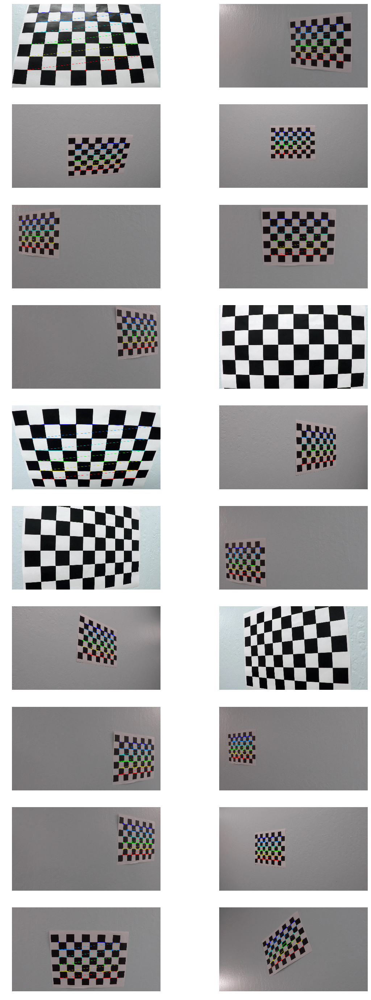

In [97]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
calibration_output_images = []

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imwrite( "./output_images/calibration_output%d.jpg" % i, img )
    
    calibration_output_images.append(img)

axs = plot_images(10, 2, (20, 50), calibration_output_images)

## 2. Distorsion correction

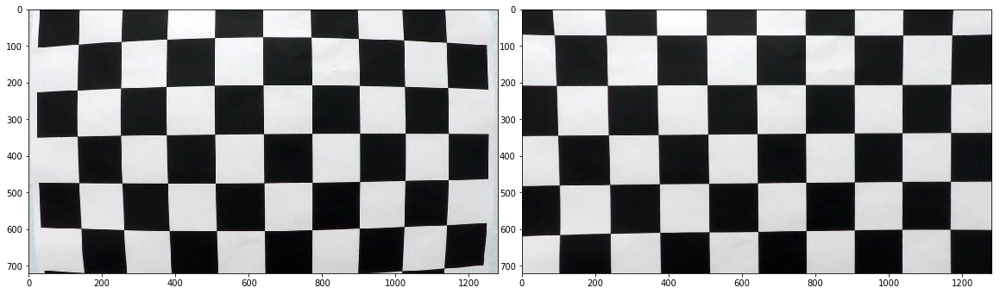

In [98]:
test_image = cv2.imread('./camera_cal/calibration1.jpg')
axs_titles = ['Original', 'Undistorted']

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, test_image.shape[0:2], None, None)
undist = cv2.undistort(test_image, mtx, dist, None, mtx)

axs = plot_images(1, 2, (20, 50), [test_image, undist], axs_titles)

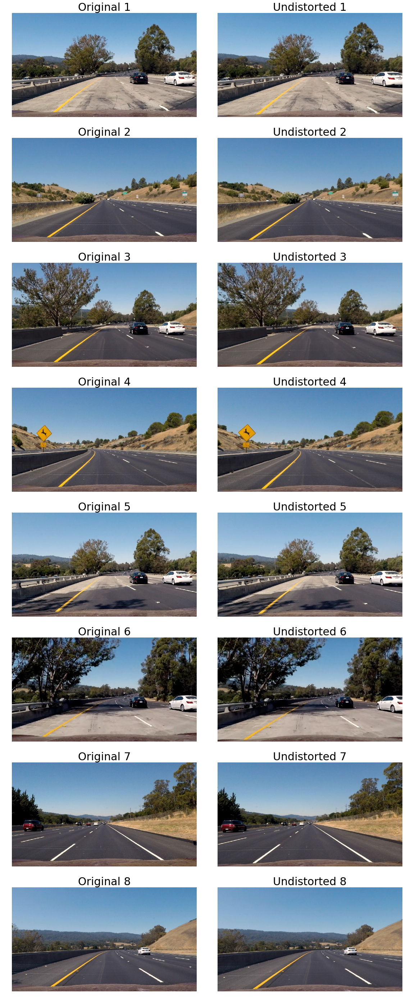

In [99]:
test_images = glob.glob('./test_images/*.jpg')
undistorted_images=[]
output_test_images=[]
axs_titles=[]

for i, fname in enumerate(test_images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    output_test_images.append(img)
    axs_titles.append('Original %d' %int(i+1))

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    undistorted_images.append(undist)
    output_test_images.append(undist)
    axs_titles.append('Undistorted %d' %int(i+1))
    

axs = plot_images(8, 2, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=30)

## 3. Transform Perspective

### Show original test images to select src points

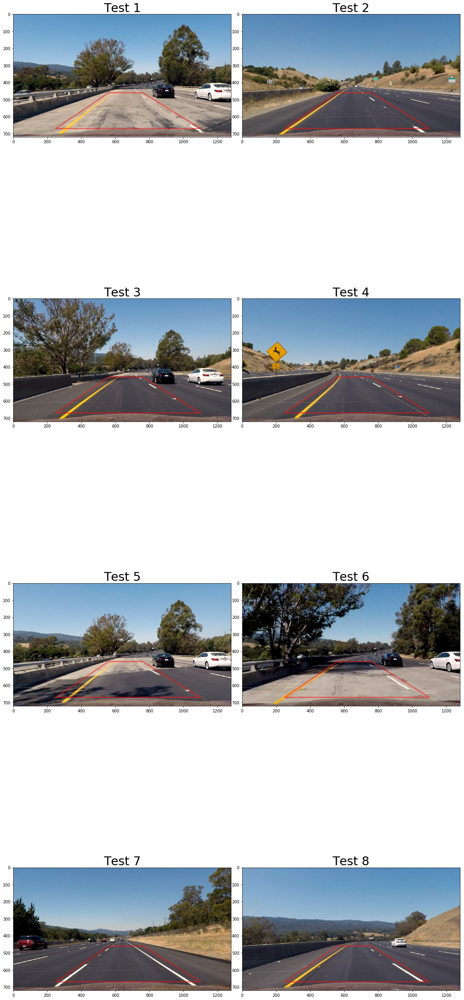

In [102]:
axs_titles = []

for i, image in enumerate(undistorted_images):
    axs_titles.append('Test %d' %int(i+1))

axs = plot_images(4, 2, (20, 50), undistorted_images, axis=True, axs_titles=axs_titles, title_fontsize=30)
x = [560.0, 760.0, 1100.0, 250.0, 560.0]
y = [460.0, 460.0, 670.0, 670.0, 460.0]

for ax in axs:
    ax.plot(x, y, color='#ff1010', alpha=0.5, linewidth=3, solid_capstyle='round', zorder=2)

In [101]:
def warp_image(img):
    img_size = img.shape[0:2]
    width, height = img_size
    
    src = np.float32(
        [
            [560.0, 460.0],
            [760.0, 460.0],
            [1100.0, 670.0],
            [250.0, 670.0],
        ]
    )
    dst = np.float32(
        [
            [150.0, 0],
            [width - 150.0, 0],
            [width - 150.0, height],
            [150.0, height],
        ]
    )
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M

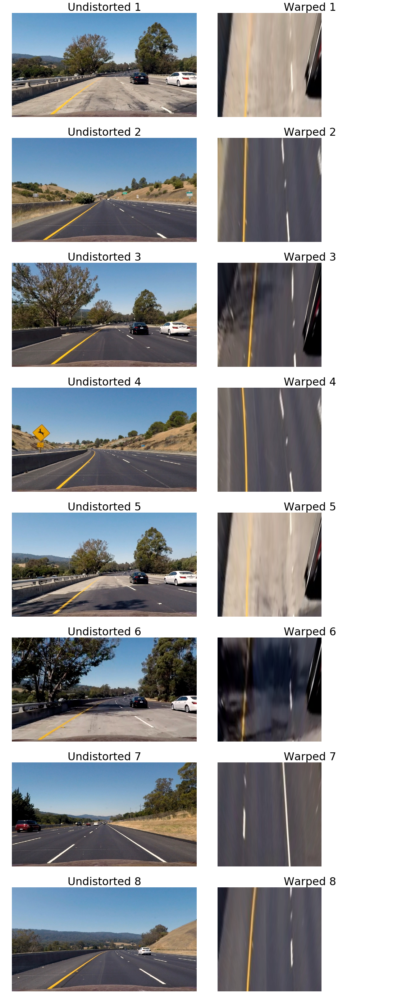

In [103]:
output_test_images = []
warped_images = []
axs_titles = []

for i, undist in enumerate(undistorted_images):
    output_test_images.append(undist)
    axs_titles.append('Undistorted %d' %int(i+1))
    
    warped_image, M = warp_image(undist)
    warped_images.append(warped_image)
    output_test_images.append(warped_image)
    axs_titles.append('Warped %d' %int(i+1))

axs = plot_images(8, 2, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=30)

## 3. Color/Gradient Threshold

### Visualizing in different color spaces

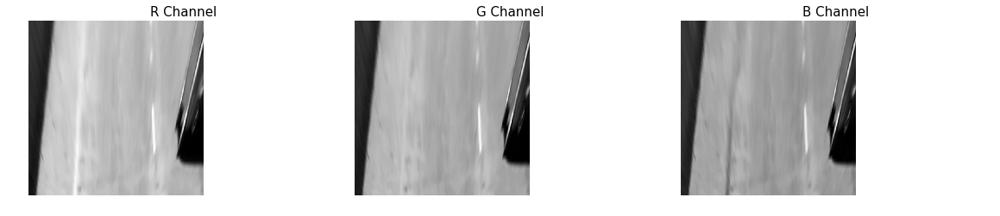

In [104]:
output_test_images = []
axs_titles = []

warped_image = warped_images[0]

# RGB
R = warped_image[:,:,0]
G = warped_image[:,:,1]
B = warped_image[:,:,2]

thresh = (180, 255)
axs_titles.append('R Channel')
output_test_images.append(R)
binary = np.zeros_like(R)

axs_titles.append('G Channel')
output_test_images.append(G)
binary = np.zeros_like(G)

axs_titles.append('B Channel')
output_test_images.append(B)
binary = np.zeros_like(B)

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, height_limit=undistorted_images[0].shape[0], width_limit=undistorted_images[0].shape[1], cmap='gray')

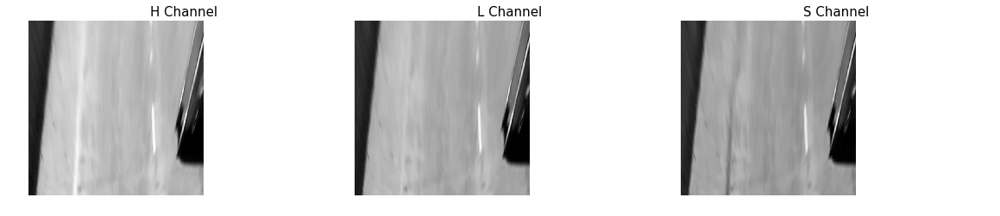

In [105]:
# HLS
output_test_images = []
axs_titles = []

warped_image = warped_images[0]
hls_image = cv2.cvtColor(warped_image, cv2.COLOR_RGB2HLS)

H = warped_image[:,:,0]
L = warped_image[:,:,1]
S = warped_image[:,:,2]

thresh = (170, 255)
axs_titles.append('H Channel')
output_test_images.append(R)
binary = np.zeros_like(R)

axs_titles.append('L Channel')
output_test_images.append(G)
binary = np.zeros_like(G)

axs_titles.append('S Channel')
output_test_images.append(B)
binary = np.zeros_like(B)

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, height_limit=undistorted_images[0].shape[0], width_limit=undistorted_images[0].shape[1], cmap='gray')

### Applying Sobel Threshold

In [106]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255), sobel_kernel=3):
    thresh_min, thresh_max = thresh
    
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(0,255)):   
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):    
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    dirs = np.arctan2(abs_sobely, abs_sobelx)
    
    binary_output = np.zeros_like(dirs)
    binary_output[(dirs >= thresh[0]) & (dirs <= thresh[1])] = 1
    
    return binary_output

def combined_thresh(img, sobel_kernel=3, abs_thresh=(20,255), _mag_thresh=(20,255), dir_thresh=(0, np.pi/2)):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=sobel_kernel, thresh=abs_thresh)
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=sobel_kernel, thresh=abs_thresh)
    
    mag_binary = mag_thresh(img, sobel_kernel=sobel_kernel, thresh=_mag_thresh)
    
    dir_binary = dir_threshold(img, sobel_kernel=sobel_kernel, thresh=dir_thresh)
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

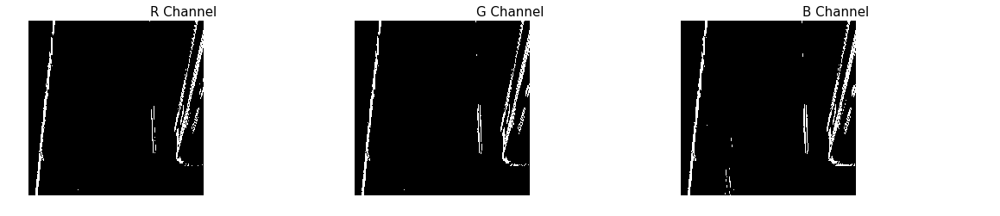

In [107]:
# RGB
output_test_images = []
axs_titles = []

axs_titles.append('R Channel')
output_test_images.append(combined_thresh(R))

axs_titles.append('G Channel')
output_test_images.append(combined_thresh(G))

axs_titles.append('B Channel')
output_test_images.append(combined_thresh(B))

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, cmap='gray')

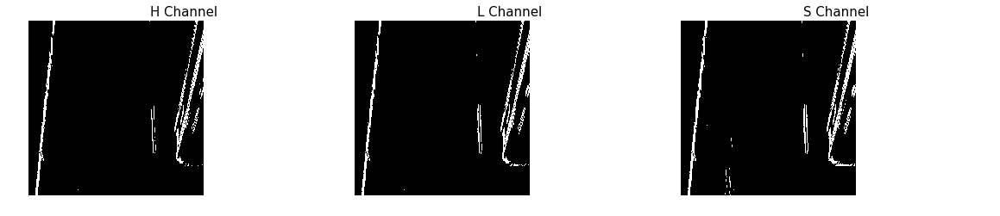

In [108]:
# HLS
output_test_images = []
axs_titles = []

axs_titles.append('H Channel')
output_test_images.append(combined_thresh(H))

axs_titles.append('L Channel')
output_test_images.append(combined_thresh(L))

axs_titles.append('S Channel')
output_test_images.append(combined_thresh(S))

axs = plot_images(1, 3, (20, 50), output_test_images, axs_titles=axs_titles, title_fontsize=15, cmap='gray')